In [14]:
import pandas as pd
import numpy as np
import re

# Import sklearn 
import statsmodels.formula.api as sm
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import learning_curve
from sklearn.model_selection import GridSearchCV

# Import Regressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression,ElasticNet
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import ExtraTreesRegressor
from catboost import CatBoostRegressor

#import the metrics
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score


#Import visualization
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import plotly.graph_objs as go
import plotly.graph_objects as go
#Ignore warnings
import warnings
warnings.filterwarnings('ignore') 

# Load the dataset to predict the unemployment Rate

In [3]:
df = pd.read_csv("/Users/aman/Documents/omdena/Kenya/data/feature_engineering/Feature_Engineered_Dataset.csv",header=0)
df.head()

,Year,Real_GDP_Ksh,Population_Growth,Female_Labor_Participation,Male_Labor_Participation,Education_Expenditure_Ksh,Inflation,Dollar_Rate,Total_Unemployment,Labor_Total_Population_Ratio,Urban_Population_Growth_Income_Per_Capita_Growth_Ratio
0,2000,982855,2.92,50.46,46.89,4.914291e+10,9.98,76.175542,3.13,0.920229,1.030328
1,2001,1020111,3.03,50.03,46.87,5.154121e+10,5.73,78.563195,3.07,0.924819,1.050862
2,2002,1025583,3.03,49.61,46.84,5.949633e+10,1.97,78.749142,3.09,0.923703,1.055151
3,2003,1055658,2.97,49.18,46.82,7.552908e+10,9.81,84.148300,3.04,0.921479,1.039266
4,2004,1109338,2.99,48.76,46.79,8.157499e+10,11.80,80.650112,3.00,0.918978,1.043338


# Calculate the correlations for all the features

In [4]:
df_corr=df.corr(method='pearson')
df_corr

,Year,Real_GDP_Ksh,Population_Growth,Female_Labor_Participation,Male_Labor_Participation,Education_Expenditure_Ksh,Inflation,Dollar_Rate,Total_Unemployment,Labor_Total_Population_Ratio,Urban_Population_Growth_Income_Per_Capita_Growth_Ratio
Year,1.000000,0.958278,-0.949936,-0.997229,-0.783145,0.855113,-0.222906,0.866087,0.676683,0.599325,-0.826015
Real_GDP_Ksh,0.958278,1.000000,-0.938077,-0.956271,-0.708740,0.825043,-0.240873,0.874588,0.597949,0.537302,-0.829863
Population_Growth,-0.949936,-0.938077,1.000000,0.950202,0.793354,-0.864708,0.299956,-0.932283,-0.695958,-0.721325,0.845177
Female_Labor_Participation,-0.997229,-0.956271,0.950202,1.000000,0.786193,-0.884954,0.234257,-0.856210,-0.673330,-0.579727,0.848788
Male_Labor_Participation,-0.783145,-0.708740,0.793354,0.786193,1.000000,-0.678050,0.284686,-0.800162,-0.981433,-0.804742,0.705676
Education_Expenditure_Ksh,0.855113,0.825043,-0.864708,-0.884954,-0.678050,1.000000,-0.291694,0.743914,0.545905,0.469383,-0.903552
Inflation,-0.222906,-0.240873,0.299956,0.234257,0.284686,-0.291694,1.000000,-0.238518,-0.256000,-0.328731,0.215224
Dollar_Rate,0.866087,0.874588,-0.932283,-0.856210,-0.800162,0.743914,-0.238518,1.000000,0.743674,0.832779,-0.757718
Total_Unemployment,0.676683,0.597949,-0.695958,-0.673330,-0.981433,0.545905,-0.256000,0.743674,1.000000,0.823253,-0.607461
Labor_Total_Population_Ratio,0.599325,0.537302,-0.721325,-0.579727,-0.804742,0.469383,-0.328731,0.832779,0.823253,1.000000,-0.480865


In [5]:
df_corr["Total_Unemployment"].sort_values(ascending=False)

Total_Unemployment                                        1.000000
Labor_Total_Population_Ratio                              0.823253
Dollar_Rate                                               0.743674
Year                                                      0.676683
Real_GDP_Ksh                                              0.597949
Education_Expenditure_Ksh                                 0.545905
Inflation                                                -0.256000
Urban_Population_Growth_Income_Per_Capita_Growth_Ratio   -0.607461
Female_Labor_Participation                               -0.673330
Population_Growth                                        -0.695958
Male_Labor_Participation                                 -0.981433
Name: Total_Unemployment, dtype: float64

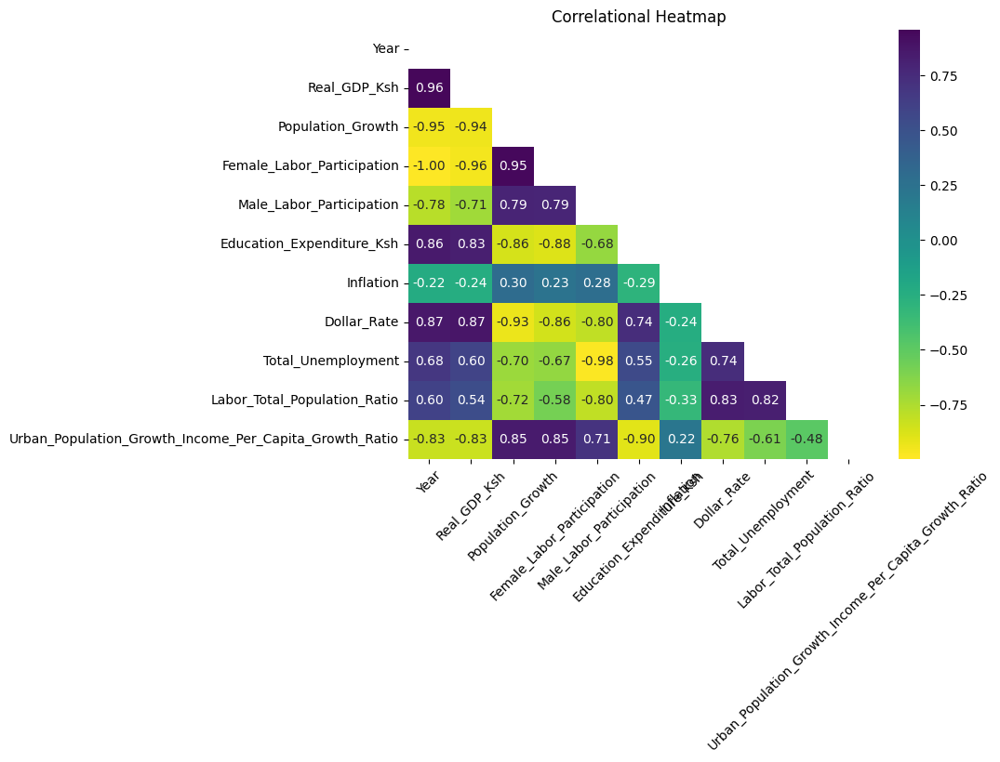

In [6]:
# Correlation Matrix
correlation_matrix = df.corr()

plt.figure(figsize=(8, 6))
mask = np.triu(correlation_matrix)
sns.heatmap(correlation_matrix, annot=True, cmap='viridis_r', center=0, mask=mask, fmt=".2f")
plt.xticks(rotation = 45)
plt.title('Correlational Heatmap')
plt.show()

# Visual correlation of each feature with the target variable with time 

In [7]:
variables = list(df.columns)  

for variable in variables:
    # Create a new figure
    fig = go.Figure()

    # Add trace for the selected variable
    fig.add_trace(go.Scatter(x=df['Year'], y=df[variable], mode='lines', name=variable, line=dict(color='green')))

    # Create second y-axis
    fig.update_layout(
        yaxis2=dict(
            overlaying='y',
            side='right',
            showgrid=False,
            title='Unemployment Rate (%)',
            titlefont=dict(color='blue'),
            tickfont=dict(color='blue')))

    # Add trace for Total_Unemployment
    fig.add_trace(go.Scatter(x=df['Year'], y=df['Total_Unemployment'], mode='lines', name='Total_Unemployment', line=dict(color='blue'), yaxis='y2'))

    # Update layout
    fig.update_layout(
        xaxis=dict(title='Year'),
        title=f'Total_Unemployment vs {variable}')

    # Show the figure
    fig.show()

# Target Variable distribution

Text(0.5, 1.0, 'Distribution of the Total_Unemployment')

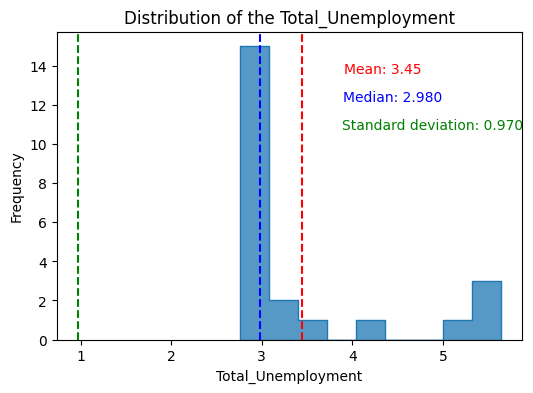

In [8]:
plt.figure(figsize=(6, 4))
sns.histplot(data=df, x='Total_Unemployment', element='step', common_norm=False)


mean = np.mean(df['Total_Unemployment'])
median = np.median(df['Total_Unemployment'])
std_deviation = np.std(df['Total_Unemployment'])

plt.axvline(mean, color='red', linestyle='--')
plt.axvline(median, color='blue', linestyle='--')
plt.axvline(x=std_deviation, color='green', linestyle='--')

# annotate mean,median & Standard deviation
plt.annotate(f'Mean: {mean:.3}', xy=(mean, plt.gca().get_ylim()[1]), xytext=(30, -30),
             textcoords='offset points', color='red', fontsize=10)
plt.annotate(f'Median: {median:.3f}', xy=(median, plt.gca().get_ylim()[1]), xytext=(60, -50),
             textcoords='offset points', color='blue', fontsize=10)
plt.annotate(f'Standard deviation: {std_deviation:.3f}', xy=(std_deviation, plt.gca().get_ylim()[1]), xytext=(190, -70),
           textcoords='offset points', color='green', fontsize=10)
plt.xlabel('Total_Unemployment')
plt.ylabel('Frequency')
plt.title('Distribution of the Total_Unemployment')

# Modeling - Target: Total_Unemployment
## a) Modify the data as follows:
- Remove Year as a feature
- Perform train test split
- Scale the dataset with MinMaxScaler

In [9]:
# Set "Year" as index:
df.set_index('Year', inplace=True)
cat_var = df[[]]
y = df[['Total_Unemployment']]

# Listing num variables
exclude_columns = cat_var + y
num_var = [col for col in df.columns if col not in exclude_columns]
X = df[num_var]
y = df[['Total_Unemployment']]

In [10]:
# Train-test split:

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42 , shuffle=True)

print(f"X_train.shape: {X_train.shape}")
print(f"X_test.shape: {X_test.shape}")
print(f"y_train.shape: {y_train.shape}")
print(f"y_test.shape: {y_test.shape}")

X_train.shape: (18, 9)
X_test.shape: (5, 9)
y_train.shape: (18, 1)
y_test.shape: (5, 1)


In [11]:
# Preprocessing with pipelines

from sklearn.pipeline import Pipeline  
from sklearn.compose import ColumnTransformer 
from sklearn.preprocessing import MinMaxScaler 

pipeline_numerical = Pipeline([('scaler', MinMaxScaler(feature_range=(0,1))),])
pipeline_full = ColumnTransformer([("numerical", pipeline_numerical, num_var),])

In [12]:
# Apply the pipeline

pipeline_full.fit(X_train)
X_train_transformed = pipeline_full.transform(X_train)
X_test_transformed = pipeline_full.transform(X_test)

print(f"X_train_transformed.shape: {X_train_transformed.shape}")
print(f"X_test_transformed.shape: {X_test_transformed.shape}")
print()
print('X_train_transformed:', type(X_train_transformed))
print('X_test_transformed:', type(X_test_transformed))

X_train_transformed.shape: (18, 9)
X_test_transformed.shape: (5, 9)

X_train_transformed: <class 'numpy.ndarray'>
X_test_transformed: <class 'numpy.ndarray'>


## b) Cross-Validation on the Training Set
#### Since our dataset is small, therefore the time series models performed poorly (tested sktime and arima/sarima models). Therefore, it was concluded that the simpler regression models perform the best on this dataset and the following six models were employed and these will be further filtered out to pick the top three performers. 

In [15]:
# Cross-validation On Training set:

models = {
    'LinearRegression': LinearRegression(),
    "ElasticNet": ElasticNet(alpha=0.02, random_state=42),  
    'DTR': DecisionTreeRegressor(random_state=42), 
    'RFR': RandomForestRegressor(random_state=42),  
    "ExtraTrees": ExtraTreesRegressor(n_estimators=5, random_state=42), 
    'CatBoost': CatBoostRegressor(random_seed=42)
} 

# Create an empty list
results = []

for model_name, model in models.items():
    r2_scores = cross_val_score(model, X_train_transformed, y_train, cv=5, scoring='r2')
    
    # Calculate Mean R-squared and Variance of R-squared
    mean_r2 = r2_scores.mean()
    variance_r2 = r2_scores.var()
    
    # Store the results 
    model_results = {
        'Model': model_name,
        'Mean R-squared': round(mean_r2, 3),
        'Variance of R-squared': round(variance_r2, 3)}
    
    # Append the results to the list
    results.append(model_results)


CV_Result = pd.DataFrame(results)

CV_Result.sort_values(by="Mean R-squared", ascending=False)

Learning rate set to 0.020858
0:	learn: 1.1320861	total: 57.3ms	remaining: 57.2s
1:	learn: 1.1200778	total: 57.4ms	remaining: 28.7s
2:	learn: 1.1091283	total: 57.6ms	remaining: 19.2s
3:	learn: 1.0970609	total: 57.8ms	remaining: 14.4s
4:	learn: 1.0867737	total: 57.9ms	remaining: 11.5s
5:	learn: 1.0767856	total: 58ms	remaining: 9.61s
6:	learn: 1.0682974	total: 58.2ms	remaining: 8.25s
7:	learn: 1.0590078	total: 58.2ms	remaining: 7.22s
8:	learn: 1.0465544	total: 58.4ms	remaining: 6.43s
9:	learn: 1.0397271	total: 58.5ms	remaining: 5.79s
10:	learn: 1.0311608	total: 58.7ms	remaining: 5.27s
11:	learn: 1.0254729	total: 58.8ms	remaining: 4.84s
12:	learn: 1.0163266	total: 59ms	remaining: 4.47s
13:	learn: 1.0063006	total: 59.1ms	remaining: 4.16s
14:	learn: 0.9959700	total: 59.2ms	remaining: 3.89s
15:	learn: 0.9859799	total: 59.4ms	remaining: 3.65s
16:	learn: 0.9774557	total: 59.6ms	remaining: 3.44s
17:	learn: 0.9672142	total: 59.7ms	remaining: 3.25s
18:	learn: 0.9601222	total: 59.8ms	remaining: 3.

,Model,Mean R-squared,Variance of R-squared
4,ExtraTrees,0.917,0.002
3,RFR,0.910,0.013
5,CatBoost,0.868,0.010
2,DTR,0.826,0.016
1,ElasticNet,0.744,0.170
0,LinearRegression,0.657,0.190


Text(0.5, 1.0, 'Mean R-squared by Model / CV On Training set')

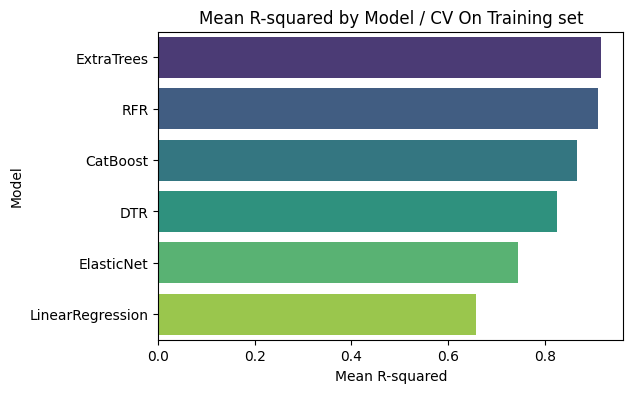

In [17]:
# Plotting "Mean R-squared" in bar chart: (Cross-validation On Training set)

CV_Result = CV_Result.sort_values(by="Mean R-squared", ascending=False)

# Create the bar plot
plt.figure(figsize=(6, 4))
sns.barplot(x="Mean R-squared", y="Model", data=CV_Result, palette="viridis")

# Add labels and title
plt.xlabel("Mean R-squared")
plt.ylabel("Model")
plt.title("Mean R-squared by Model / CV On the Training set")

### **Extra Trees**, **Random Forest** and **CatBoost** seem to be the best-performing models, with Extra Trees having a slightly higher average accuracy.

#### Let us plot the Learning Curves for the features to visualize the convergance of each feature

/Users/aman/Library/Python/3.9/lib/python/site-packages/sklearn/metrics/_regression.py:918: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/aman/Library/Python/3.9/lib/python/site-packages/sklearn/metrics/_regression.py:918: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/aman/Library/Python/3.9/lib/python/site-packages/sklearn/metrics/_regression.py:918: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/aman/Library/Python/3.9/lib/python/site-packages/sklearn/metrics/_regression.py:918: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/aman/Library/Python/3.9/lib/python/site-packages/sklearn/metrics/_regression.py:918: UndefinedMetricWarning: R^2 scor

Learning rate set to 0.018694
Learning rate set to 0.016352
Learning rate set to 0.017726
Learning rate set to 0.015337
Learning rate set to 0.019093
Learning rate set to 0.018244
Learning rate set to 0.019451
Learning rate set to 0.017112
0:	learn: 0.9690639	total: 61.1ms	remaining: 1m 1s
1:	learn: 0.9640834	total: 61.3ms	remaining: 30.6s
2:	learn: 0.9570103	total: 61.3ms	remaining: 20.4s
3:	learn: 0.9530143	total: 61.5ms	remaining: 15.3s
4:	learn: 0.9481380	total: 61.6ms	remaining: 12.3s
5:	learn: 0.9431549	total: 61.7ms	remaining: 10.2s
6:	learn: 0.9394862	total: 61.8ms	remaining: 8.77s
7:	learn: 0.9339305	total: 61.9ms	remaining: 7.67s
8:	learn: 0.9278215	total: 62ms	remaining: 6.82s
9:	learn: 0.9233013	total: 62.1ms	remaining: 6.15s
10:	learn: 0.9165786	total: 62.1ms	remaining: 5.58s
11:	learn: 0.9111268	total: 62.2ms	remaining: 5.12s
12:	learn: 0.9052115	total: 62.3ms	remaining: 4.73s
13:	learn: 0.9004466	total: 62.4ms	remaining: 4.39s
14:	learn: 0.8949723	total: 62.5ms	remaining

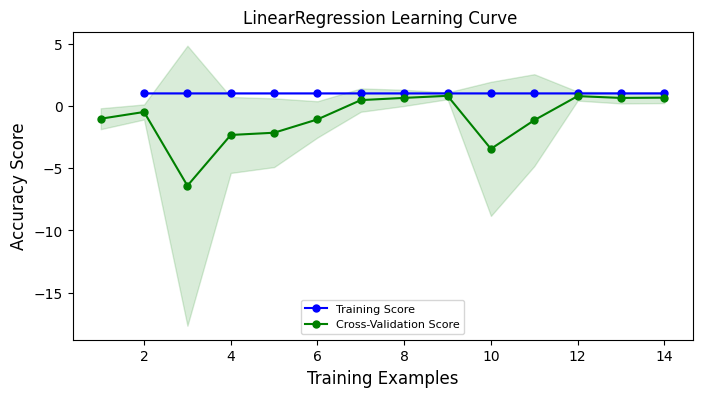

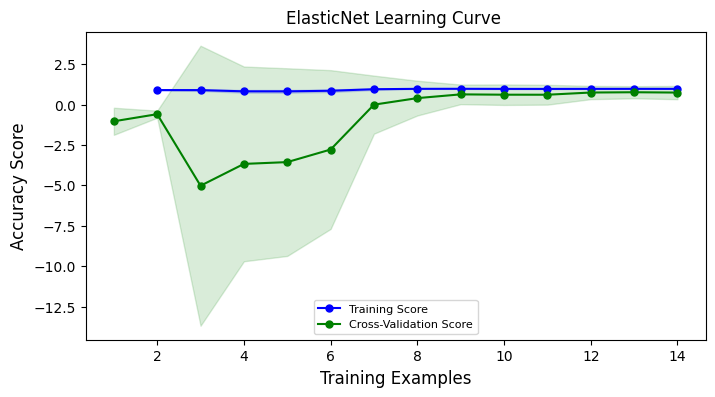

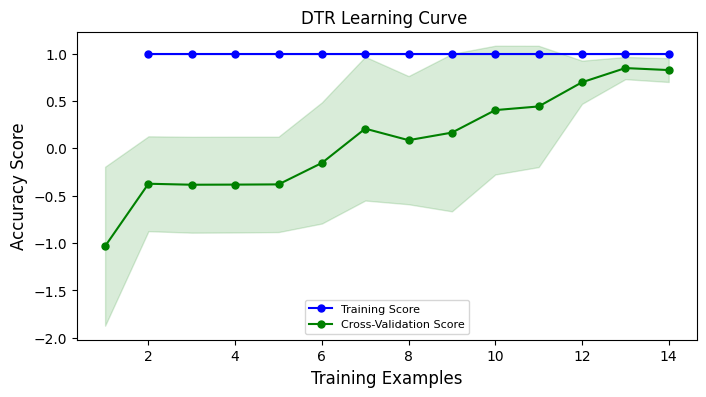

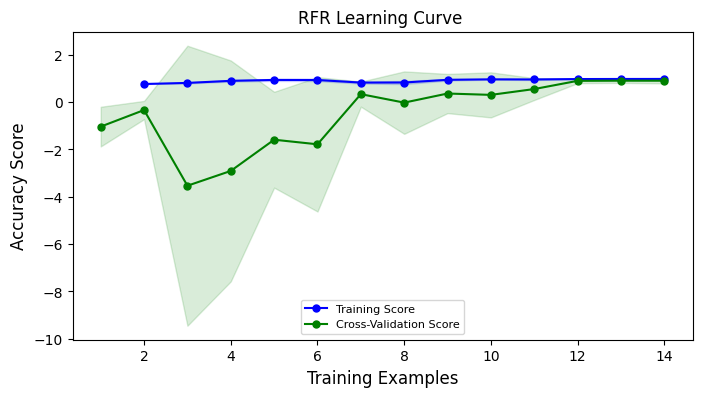

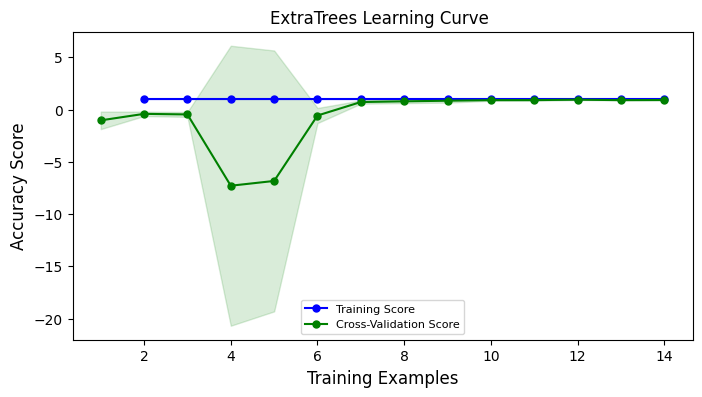

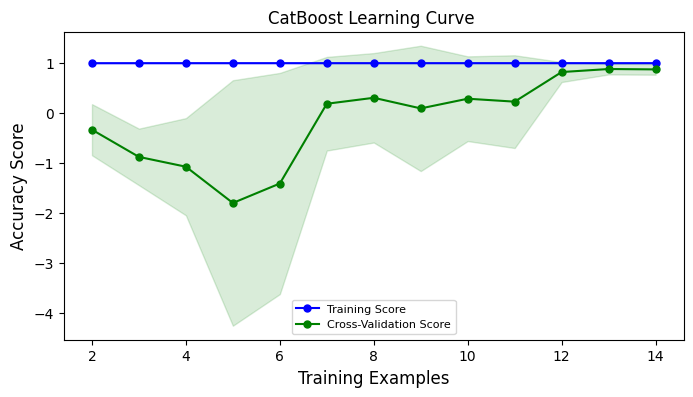

In [18]:

# Define the training sizes for the learning curve
train_sizes = np.linspace(0.1, 1.0, 20)

for model_name, model in models.items():
    # Calculate learning curve
    train_sizes, train_scores, test_scores = learning_curve(
        estimator=model, X=X_train_transformed, y=y_train,
        cv=5, train_sizes=train_sizes, n_jobs=-1)

    # Calculate training and test mean and std
    train_mean = np.mean(train_scores, axis=1)
    train_std = np.std(train_scores, axis=1)
    test_mean = np.mean(test_scores, axis=1)
    test_std = np.std(test_scores, axis=1)

    # Plot the learning curve
    plt.figure(figsize=(8, 4))
    plt.plot(train_sizes, train_mean, color='blue', marker='o', markersize=5, label='Training Score')
    plt.fill_between(train_sizes, train_mean + train_std, train_mean - train_std, alpha=0.15, color='blue')

    plt.plot(train_sizes, test_mean, color='green', marker='o', markersize=5, label='Cross-Validation Score')
    plt.fill_between(train_sizes, test_mean + test_std, test_mean - test_std, alpha=0.15, color='green')

    plt.title(f'{model_name} Learning Curve ')
    plt.xlabel('Training Examples', fontsize=12)
    plt.ylabel('Accuracy Score', fontsize=12)

    plt.legend(loc='lower center', fontsize=8)


## c) Hyperparameter Tuning - GridSearchCV

In [19]:
# define the grid search function 
def grid_search_fit(model,params):   
    grid_search = GridSearchCV(model, param_grid=params, cv=5, scoring='neg_mean_squared_error',n_jobs=-1, verbose=0)
    grid_search.fit(X_train_transformed,y_train)
    best_regressor = grid_search.best_estimator_
    best_params = grid_search.best_params_
    y_pred= best_regressor.predict(X_test_transformed)

    r2 = r2_score(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    evaluation_metrics = {
        'best params':best_params,
        'model':re.sub(r'[^a-zA-Z]', '',str(model)), # save the model name as the string after removing the ()
        'R2 Score': r2,
        'MAE': mae,
        'MSE': mse,
        'RMSE': rmse
    }

    return evaluation_metrics

**Hyperparameter Search for Decision Tree Regressor:**

In [20]:
params= {
    'max_depth': [None, 10, 20, 30, 40, 50],  
    'min_samples_split': [2, 4, 8],  
    'min_samples_leaf': [1, 2, 4]}

DTR_metrics=grid_search_fit(DecisionTreeRegressor(),params)
DTR_metrics

{'best params': {'max_depth': 40,
  'min_samples_leaf': 1,
  'min_samples_split': 2},
 'model': 'DecisionTreeRegressor',
 'R2 Score': -0.6832047041528844,
 'MAE': 0.192,
 'MSE': 0.10991999999999998,
 'RMSE': 0.3315418525616336}

**Hyperparameter Search for Random Forest Regressor:**

In [21]:
params = {
            "n_estimators"      : [4, 5, 10, 20, 50, 200],
            "max_features"      : ["sqrt", "log2"],
            "min_samples_split" : [2, 4, 8],
            'max_depth': [10, 20, 30, 40, 50, None],
            "bootstrap": [True, False]}

RFR_metrics=grid_search_fit(RandomForestRegressor(),params)


/Users/aman/Library/Python/3.9/lib/python/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/aman/Library/Python/3.9/lib/python/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/aman/Library/Python/3.9/lib/python/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/aman/Library/Python/3.9/lib/python/site-packages/sklearn/model_selection/_validation

**Hyperparameter Search for Extra Trees Regressor:**

In [22]:
params= {
            "n_estimators"      : [4, 5, 10, 20, 50, 200],
            "max_features"      : ["auto", "sqrt", "log2"],
            "min_samples_split" : [2, 4, 8],
            'max_depth': [10, 20, 30, 40, 50, None],
            "bootstrap": [True, False]}


ETR_metrics=grid_search_fit(ExtraTreesRegressor(),params)


/Users/aman/Library/Python/3.9/lib/python/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/aman/Library/Python/3.9/lib/python/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/aman/Library/Python/3.9/lib/python/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/aman/Library/Python/3.9/lib/python/site-packages/sklearn/ensemble/_forest.py:413: Fu

**Hyperparameter Search for Elastic Net Regression:**

In [25]:
params = {
    'alpha': [0.01, 0.1, 1.0, 10.0],  
    'l1_ratio': [0.1, 0.5, 0.7, 0.9],  
    'max_iter': [1000, 2000, 5000]}
ENR_metrics=grid_search_fit(ElasticNet(),params)


**Hyperparameter Search for CatBoost Regressor:**

In [24]:
params = {
    'iterations': [100, 200, 300],  # Number of iterations
    'learning_rate': [0.01, 0.1],  # Learning rate
    'depth': [4,6, 8, 10],  # Depth of the trees
    'l2_leaf_reg': [3, 5, 7],  # L2 regularization
}

CBR_metrics=grid_search_fit(CatBoostRegressor(),params)



0:	learn: 1.1368182	total: 302us	remaining: 29.9ms
1:	learn: 1.1320725	total: 390us	remaining: 19.1ms
2:	learn: 1.1274661	total: 459us	remaining: 14.9ms
3:	learn: 1.1213783	total: 535us	remaining: 12.8ms
4:	learn: 1.1160427	total: 604us	remaining: 11.5ms
5:	learn: 1.1111974	total: 648us	remaining: 10.2ms
0:	learn: 1.0342082	total: 814us	remaining: 80.7ms
6:	learn: 1.1066197	total: 729us	remaining: 9.69ms
1:	learn: 1.0290226	total: 886us	remaining: 43.4ms
2:	learn: 1.0240219	total: 937us	remaining: 30.3ms
7:	learn: 1.1013225	total: 803us	remaining: 9.23ms
3:	learn: 1.0187729	total: 1ms	remaining: 24ms
8:	learn: 1.0955586	total: 877us	remaining: 8.87ms
4:	learn: 1.0145248	total: 1.07ms	remaining: 20.4ms
9:	learn: 1.0906266	total: 923us	remaining: 8.31ms
5:	learn: 1.0094415	total: 1.15ms	remaining: 18ms
10:	learn: 1.0856500	total: 986us	remaining: 7.98ms
11:	learn: 1.0809562	total: 1.03ms	remaining: 7.56ms
6:	learn: 1.0044831	total: 1.21ms	remaining: 16ms
12:	learn: 1.0754021	total: 1.09m

**Hyperparameter Search for Linear Regressor:**

In [26]:
# Define the parameter grid for Linear Regressor
params = {
    'fit_intercept': [True, False] # Whether to calculate the intercept
}
LR_metrics=grid_search_fit(LinearRegression(),params)


### Save the metrics for each model in a dataframe 

In [32]:
# Create DataFrames from the metric results which were saved as dictionaries
df1 = pd.DataFrame([DTR_metrics])
df2 = pd.DataFrame([RFR_metrics])
df3 = pd.DataFrame([LR_metrics])
df4 = pd.DataFrame([ENR_metrics])
df5 = pd.DataFrame([CBR_metrics])
df6 = pd.DataFrame([ETR_metrics])

# Concatenate DataFrames along the rows (axis=0)
combined_df = pd.concat([df1, df2, df3,df4,df5,df6], axis=0)

# Reset the index if needed
combined_df.reset_index(drop=True, inplace=True)


results=combined_df.sort_values(by="R2 Score",ascending=False)
final_metrics=results.drop('best params',axis=1)
final_metrics

,model,R2 Score,MAE,MSE,RMSE
1,RandomForestRegressor,0.903681,0.060000,0.006290,0.079310
3,ElasticNet,0.681094,0.129358,0.020826,0.144312
4,catboostcoreCatBoostRegressorobjectatxedc,0.669156,0.095021,0.021605,0.146988
2,LinearRegression,0.117459,0.208542,0.057633,0.240070
0,DecisionTreeRegressor,-0.683205,0.192000,0.109920,0.331542
5,ExtraTreesRegressor,-2.626808,0.251067,0.236845,0.486667


## Visualize the metrics for each model

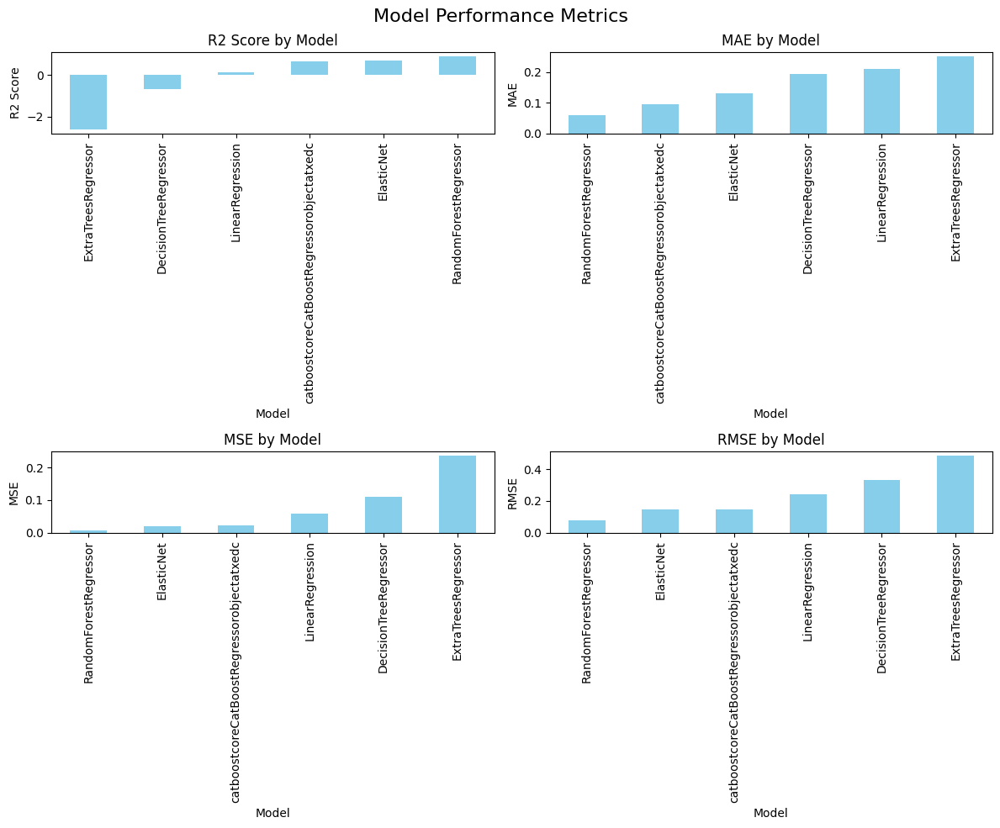

In [33]:
# Set the index to 'Model' column
final_metrics.set_index('model', inplace=True)

# Define a list of metrics to plot
metrics = ['R2 Score', 'MAE', 'MSE', 'RMSE']

# Create subplots for each metric
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
fig.suptitle('Model Performance Metrics', fontsize=16)

for i, metric in enumerate(metrics):
    row, col = divmod(i, 2)
    ax = axes[row, col]

    # Sort the DataFrame by the metric in ascending order
    sorted_df = final_metrics.sort_values(by=metric)
    sorted_df[metric].plot(kind='bar', ax=ax, color='skyblue')
    
    ax.set_title(f'{metric} by Model')
    ax.set_xlabel('Model')
    ax.set_ylabel(metric)
    plt.tight_layout()




## From the above, it seems that the following models perform the best based on the combined metrics:
- ### Random Forest Regressor
- ### Catboost Regressor
- ### Elastic Net

#### We can comment out the other three models and proceed with the three models above for the next task.

# That is all Folks!!!